In [2]:
#important imports
import pickle
from os.path import join, dirname, abspath
import numpy as np
from matplotlib import pyplot as plt 
import array
import seaborn as sns
import pandas as pd
import os.path
from hmmviz import TransGraph
import networkx as nx
import nxviz.plots

#a warning will possibly be presented on the nxviz API, do not worry about  this

/mnt/Data1/anaconda3/lib/python3.9/site-packages/nxviz/__init__.py:18: UserWarning: 
nxviz has a new API! Version 0.7.4 onwards, the old class-based API is being
deprecated in favour of a new API focused on advancing a grammar of network
graphics. If your plotting code depends on the old API, please consider
pinning nxviz at version 0.7.4, as the new API will break your old code.

To check out the new API, please head over to the docs at
https://ericmjl.github.io/nxviz/ to learn more. We hope you enjoy using it!

(This deprecation message will go away in version 1.0.)

  warnings.warn(


To create transisition matrices, we need the .CSV files generated in the AnalysisExtraction notebook. the ones labeled "bigram_transition_matrix" contain a matrix of values regarding the transition between syllables, meanwhile the "syllable counts" files contains a list of how much each of the  

In [52]:
#settings window

#fill in which files to load to create the transition matrices, 
#ensure thate the order of the files and usagefiles are the same!
files=["/mnt/Data1/Arun/LMT/LMT_data/transition_Final/Shank2_KO_std1_f_EE_bigram_transition_matrix.csv",
       "/mnt/Data1/Arun/LMT/LMT_data/transition_Final/Shank2_KO_std1_f_SH_bigram_transition_matrix.csv",
       "/mnt/Data1/Arun/LMT/LMT_data/transition_Final/Shank2_WT_std1_f_EE_bigram_transition_matrix.csv",
       "/mnt/Data1/Arun/LMT/LMT_data/transition_Final/Shank2_WT_std1_f_SH_bigram_transition_matrix.csv",
       "/mnt/Data1/Arun/LMT/LMT_data/transition_Final/Shank2_KO_std1_m_EE_bigram_transition_matrix.csv",
       "/mnt/Data1/Arun/LMT/LMT_data/transition_Final/Shank2_KO_std1_m_SH_bigram_transition_matrix.csv",
       "/mnt/Data1/Arun/LMT/LMT_data/transition_Final/Shank2_WT_std1_m_EE_bigram_transition_matrix.csv",
       "/mnt/Data1/Arun/LMT/LMT_data/transition_Final/Shank2_WT_std1_m_SH_bigram_transition_matrix.csv"]
usagefiles=["/mnt/Data1/Arun/LMT/LMT_data/transition_Final/Shank2_KO_std1_f_EE_counts.csv",
       "/mnt/Data1/Arun/LMT/LMT_data/transition_Final/Shank2_KO_std1_f_SH_counts.csv",
       "/mnt/Data1/Arun/LMT/LMT_data/transition_Final/Shank2_WT_std1_f_EE_counts.csv",
       "/mnt/Data1/Arun/LMT/LMT_data/transition_Final/Shank2_WT_std1_f_SH_counts.csv",
       "/mnt/Data1/Arun/LMT/LMT_data/transition_Final/Shank2_KO_std1_m_EE_counts.csv",
    "/mnt/Data1/Arun/LMT/LMT_data/transition_Final/Shank2_KO_std1_m_SH_counts.csv",
       "/mnt/Data1/Arun/LMT/LMT_data/transition_Final//Shank2_WT_std1_m_EE_counts.csv",
       "/mnt/Data1/Arun/LMT/LMT_data/transition_Final/Shank2_WT_std1_m_SH_counts.csv"]
#the labels of the different mouse, fill in here what you want the mouse to be called on the graphs
mouselabels=["Shank2 MUT EE F","Shank2 MUT std F","Shank2 Wt EE F","Shank2 Wt std F",
             "Shank2 MUT EE M","Shank2 MUT std M","Shank2 Wt EE M","Shank2 Wt std M"]
#the threshold for a tranisition between two syllables to remain in the graph, 
#higher values mean less transition are graphed 
treshold=0.001


#scaling variables, these variables dictate how the way the graphs scale sizewise
#only change these settings if plots do not generate nicely
uni_edge_scaling=0 #uniform size of the connections between syllables
rel_edge_scaling=100 #syllable transition scaling relative to their usage
uni_node_scaling=10 #uniform size increase of nodes (syllables) in the graph
node_scaling=12000 #scaling of the node relative to their usages

#saving location of graphs, if the folder does not exist, it will be created
save_path="./Shank2 LMT/"
# Check whether the specified path exists or not
isExist = os.path.exists(save_path)

if not isExist:
  
  # Create a new directory because it does not exist 
  os.makedirs(save_path)
  print("The new directory is created!")

The new directory is created!


In [53]:
#load in the usages and put them in a python readable format
usages=[]
counts=[]
for i in range(len(usagefiles)):
    countfile=pd.read_csv(usagefiles[i])
    counts=np.array(countfile)
    counts=counts[:,1]
    counts=counts/np.sum(counts)
    usages.append(counts)   


In [54]:
#load in the matrices, filter out any connections below the threshold and create a workable format
arraytest=[]
for i in range(len(files)):
    file_name=files[i]
    transmatrix=np.loadtxt(file_name, delimiter=",")
    transmatrix[abs(transmatrix)<treshold]=0
    arraytest.append(transmatrix)
arraylist=[np.loadtxt(file_name, delimiter=",")]


In [55]:
#create a set of labels for not only the absolute transition graph, but also the relative transisiton graphs
labelsdiff=[]
usagediff=[]
for i in range(len(files)):
    for j in range(len(files)-i-1):
        arraytest.append(arraytest[i]-arraytest[i+j+1])
        labelname=mouselabels[i]+" - "+mouselabels[i+j+1]
        usagediff.append((usages[i]-usages[i+j+1]))
        labelsdiff.append(labelname)


In [56]:
#generate the graphs on an object level (not visualized, but "saved" for the program)
graphs=[]
for ii in range(len(arraytest)):
    labels={}
    edge_labels={}
    grapharray=arraytest[ii]
    G = nx.MultiDiGraph() 
    G.add_nodes_from(range(len(arraytest[ii])))
    for i in range(len(grapharray)):
        for j in range(len(grapharray)):
            rate = grapharray[i,j]
            if abs(rate) > treshold:
                G.add_edge(i,
                           j,
                           weight=rate*rel_edge_scaling+uni_edge_scaling,
                           label="{:.02f}".format(rate))
                edge_labels[(i, j)] = label="{:.02f}".format(rate)
    graphs.append([G])

In [57]:
G = nx.Graph()
G.add_edge(1, 2, strength=0.05)
G.add_edge(2, 3, strength=0.01)
G.add_edge(3, 4, strength=-0.01)
G.add_edge(4, 5, strength=-0.05)

# Draw the networkx graph
pos = nx.spring_layout(G)

# Get edge strengths
edge_strengths = nx.get_edge_attributes(G, 'strength')

# Create a custom legend for edge strengths

legend_lines_rel = [plt.Line2D([], [], color='red', linewidth=uni_edge_scaling + rel_edge_scaling * abs(value )) if value >= 0 else plt.Line2D([], [], color='blue', linewidth=uni_edge_scaling + rel_edge_scaling * abs(value)) for value in edge_strengths.values()]

legend_labels_rel = [f'{(value*100):.0f}'+"%" for value in edge_strengths.values()]


In [58]:
G = nx.Graph()
G.add_edge(1, 2, strength=0.10)
G.add_edge(2, 3, strength=0.05)
G.add_edge(3, 4, strength=0.01)


# Draw the networkx graph
pos = nx.spring_layout(G)

# Get edge strengths
edge_strengths = nx.get_edge_attributes(G, 'strength')

# Create a custom legend for edge strengths


legend_lines = [plt.Line2D([], [], color='black', linewidth=uni_edge_scaling + rel_edge_scaling * abs(value )) for value in edge_strengths.values()]

legend_labels = [f'{(value*100):.0f}'+"%" for value in edge_strengths.values()]


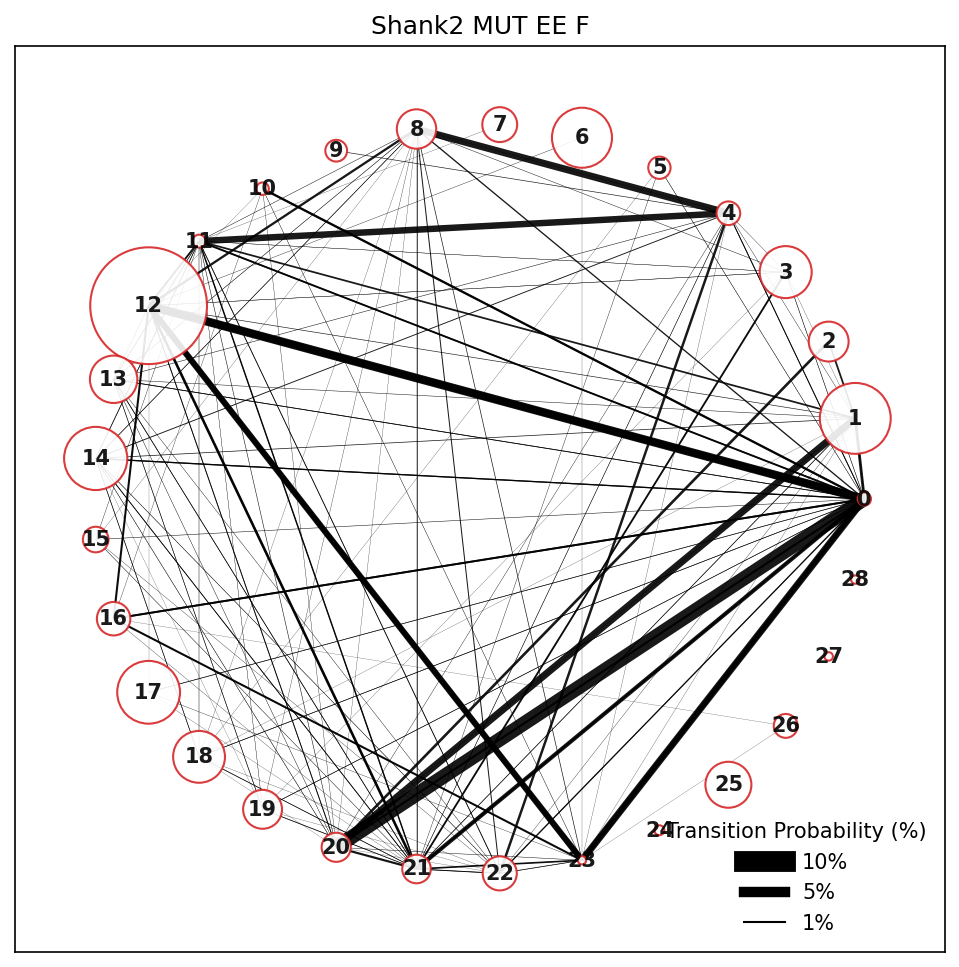

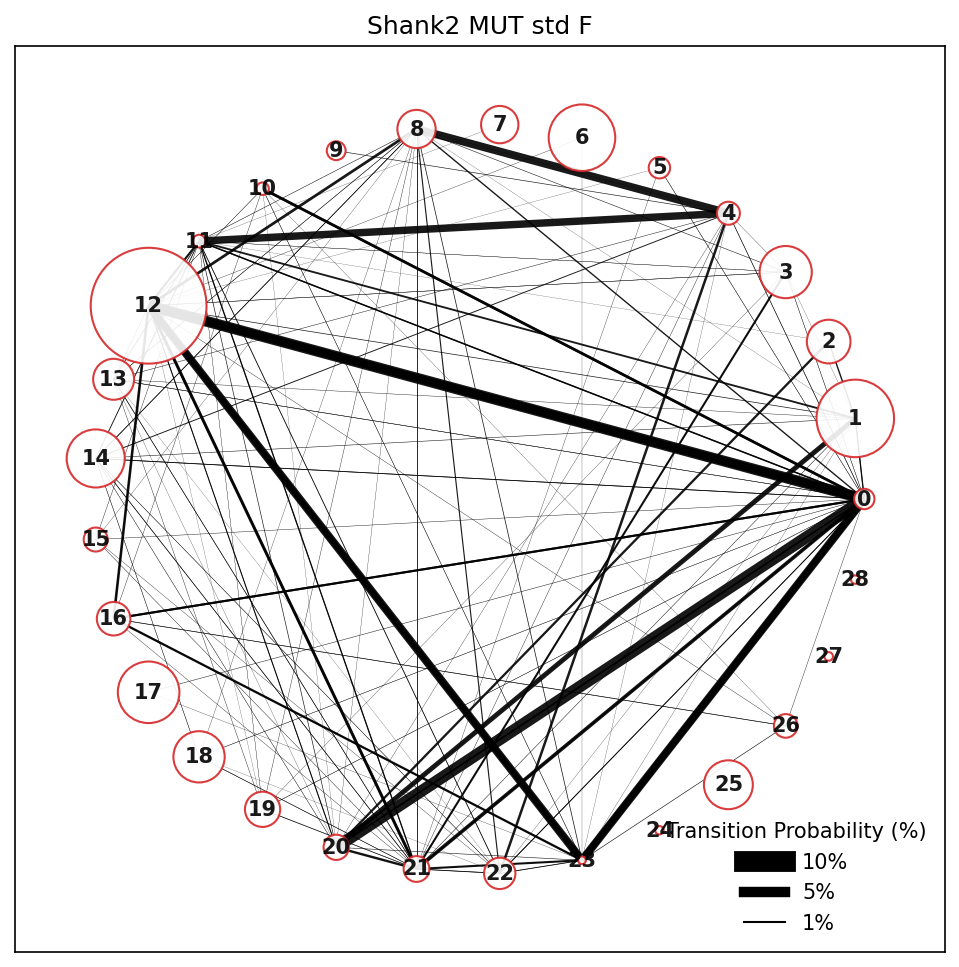

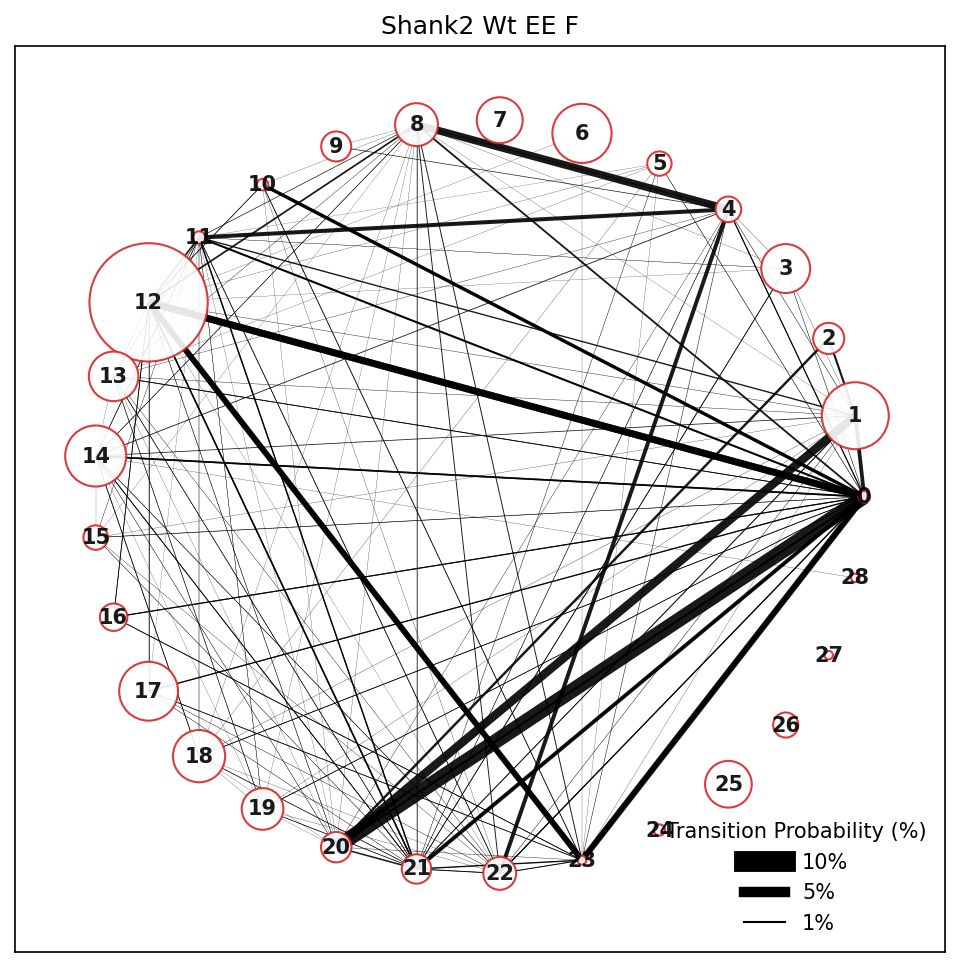

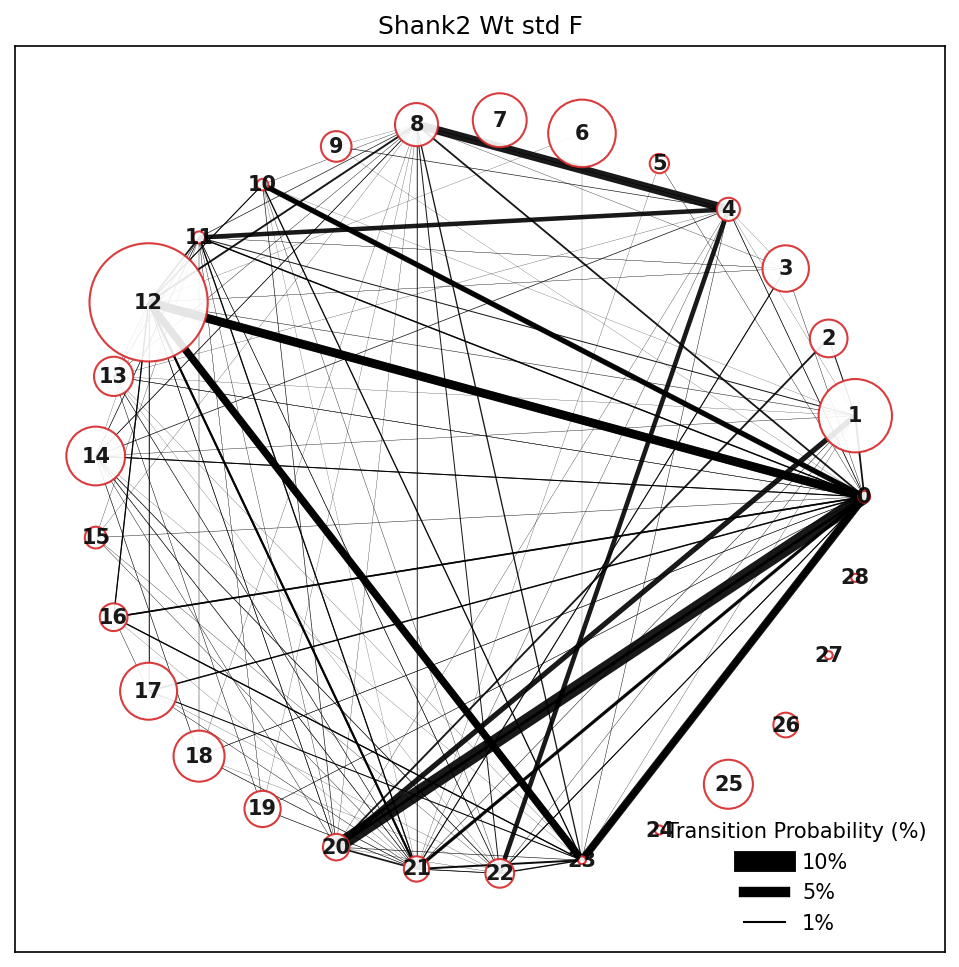

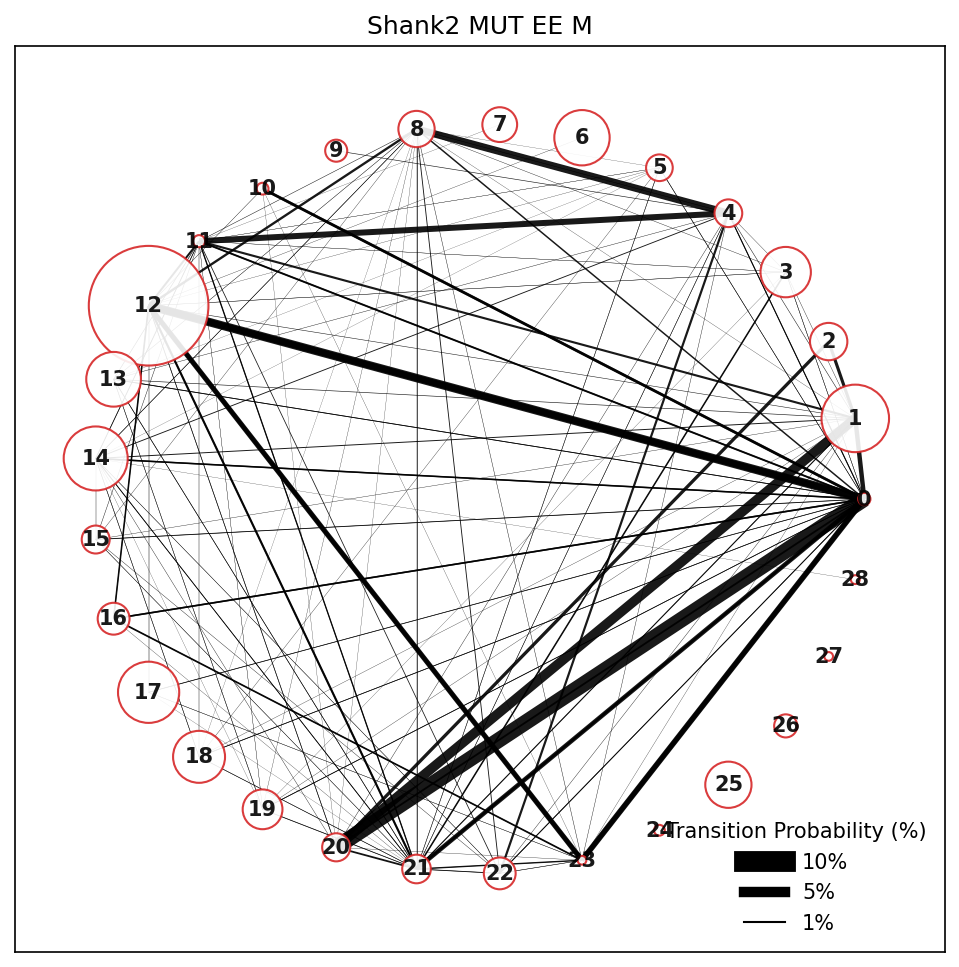

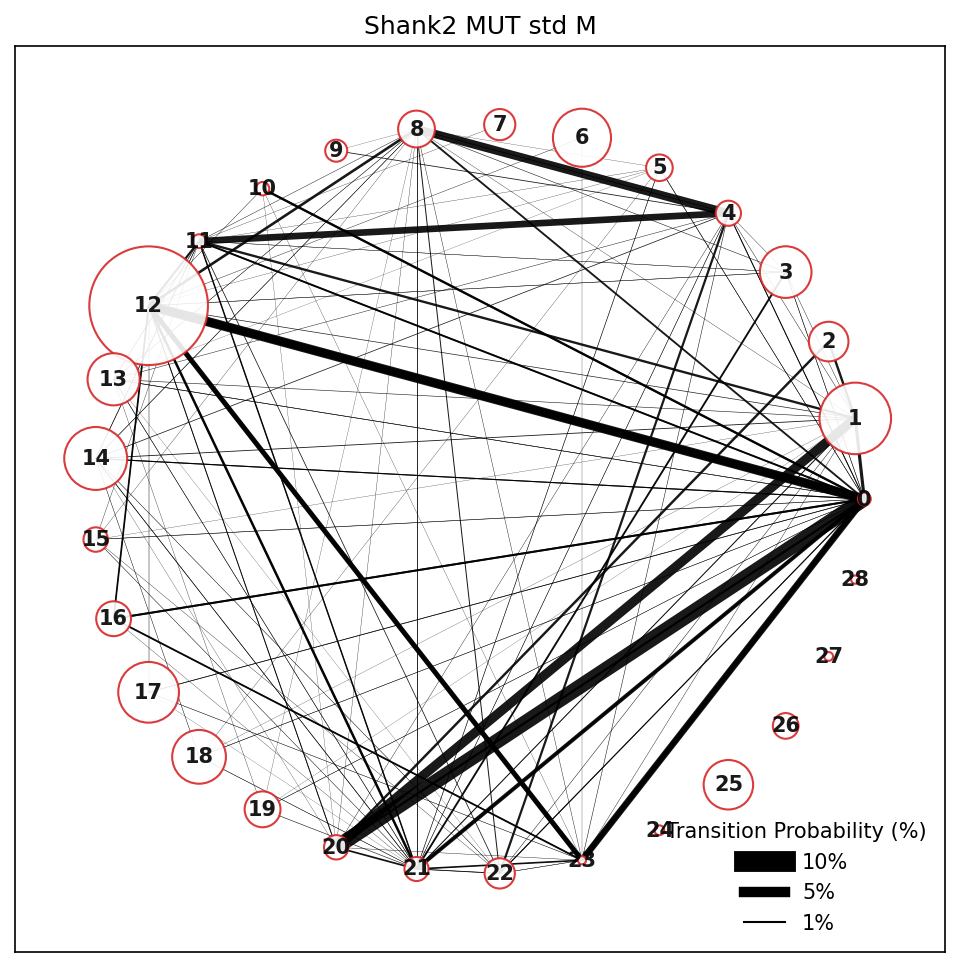

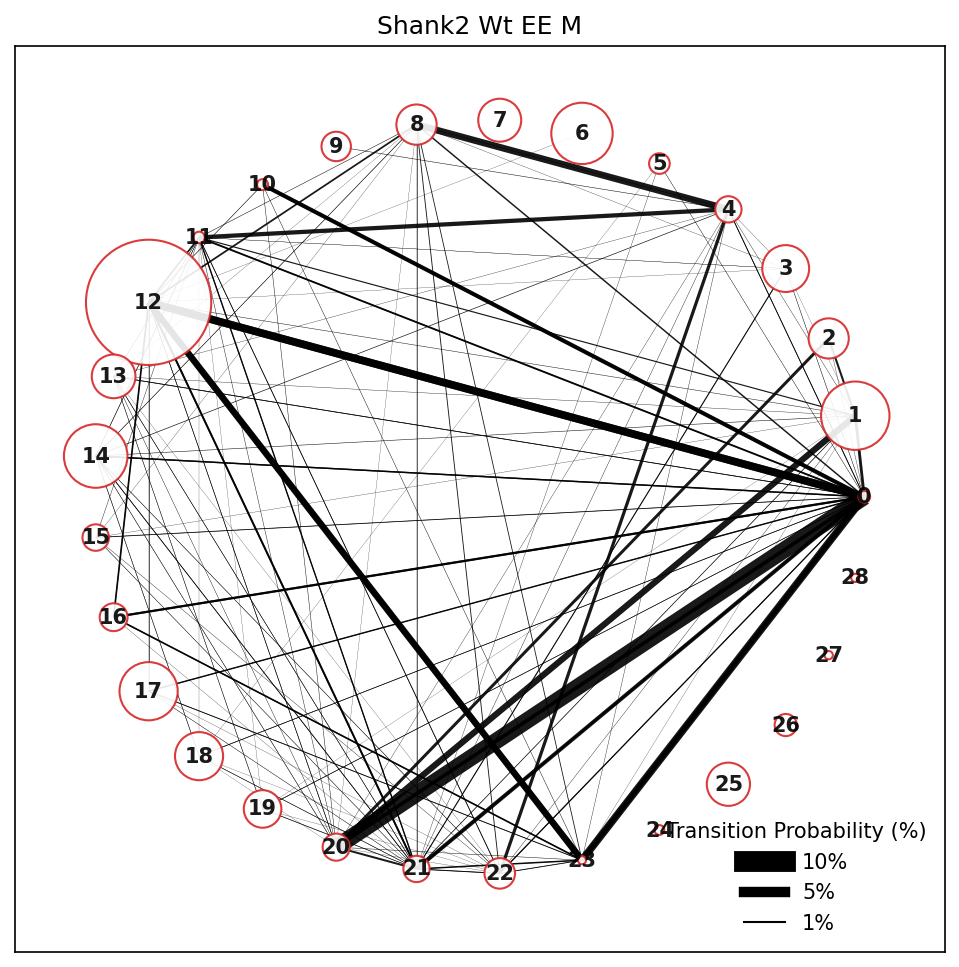

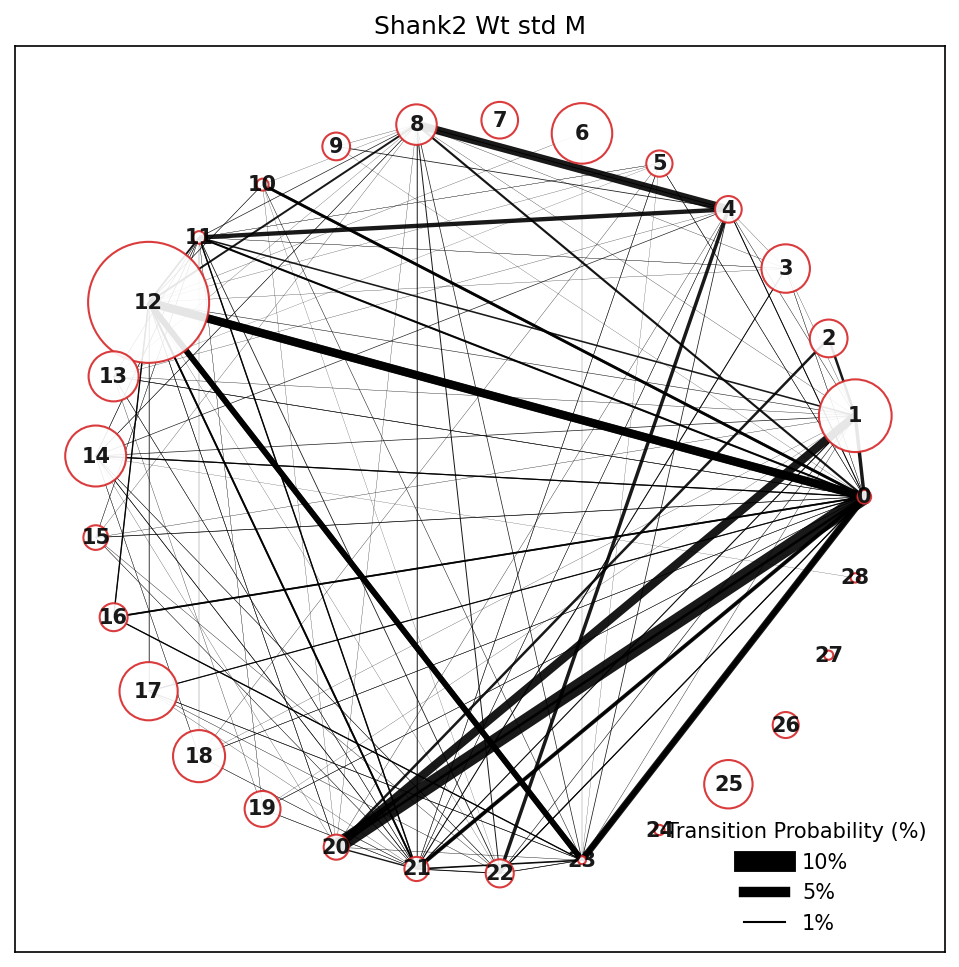

In [59]:
#plot the aboslute graphs, and save the figures in an svg format for editing 
for i in range(len(files)):
    G=graphs[i][0]
    pos=nx.circular_layout(G)
    plt.figure(figsize=(8, 8),dpi=150)
    nodesize=uni_node_scaling+abs(node_scaling*usages[i])
#print(G)
    plt.title(mouselabels[i])
    options = {"edgecolors": "tab:red", "alpha": 0.9}
    edge_weight = list(nx.get_edge_attributes(G,'weight').values())
    nx.draw_networkx(G, with_labels=True, font_weight='bold',
                     pos=pos,width=edge_weight,node_size=list(nodesize),arrows=False,
                     node_color="w",font_size=10, font_color="k", **options)
    filename=str(mouselabels[i])+"_network.svg"
    plt.legend(legend_lines, legend_labels, title='Transition Probability (%)', frameon=False, loc='lower right')

    plt.savefig(join(save_path, filename), format = 'svg', dpi=300)

/tmp/ipykernel_3547565/2207762558.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(8, 8),dpi=150)


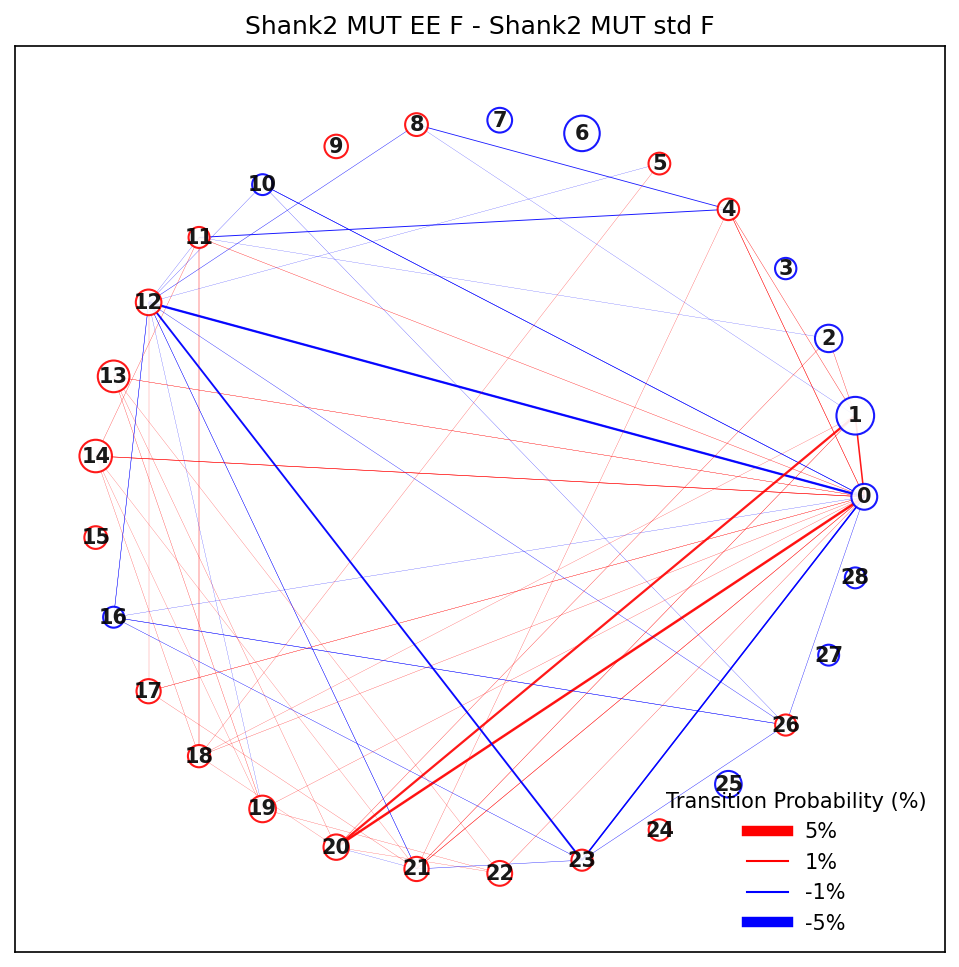

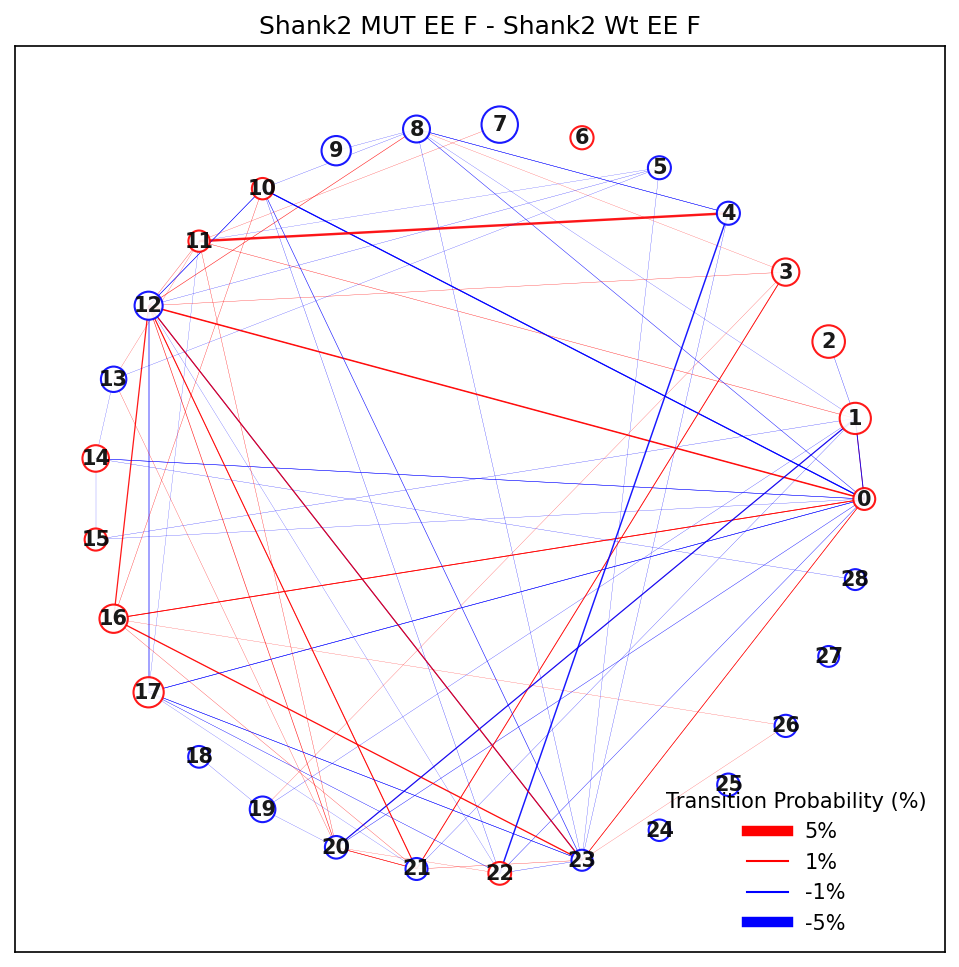

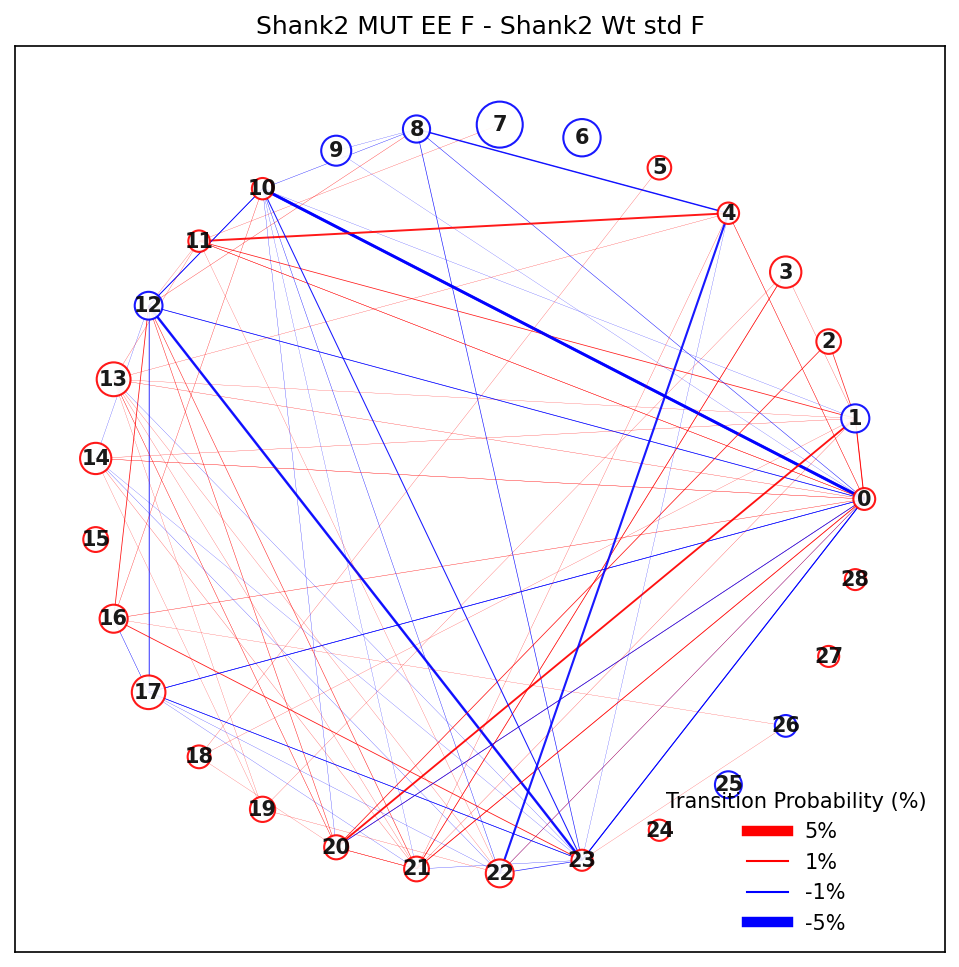

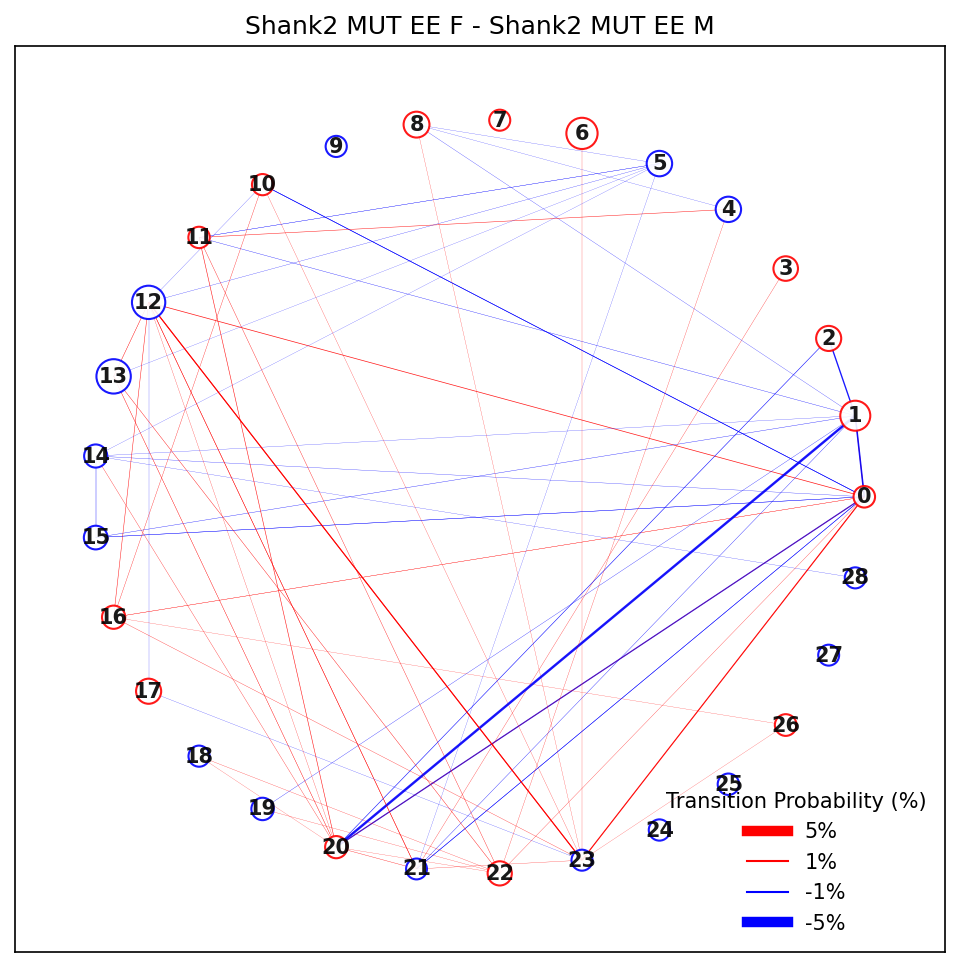

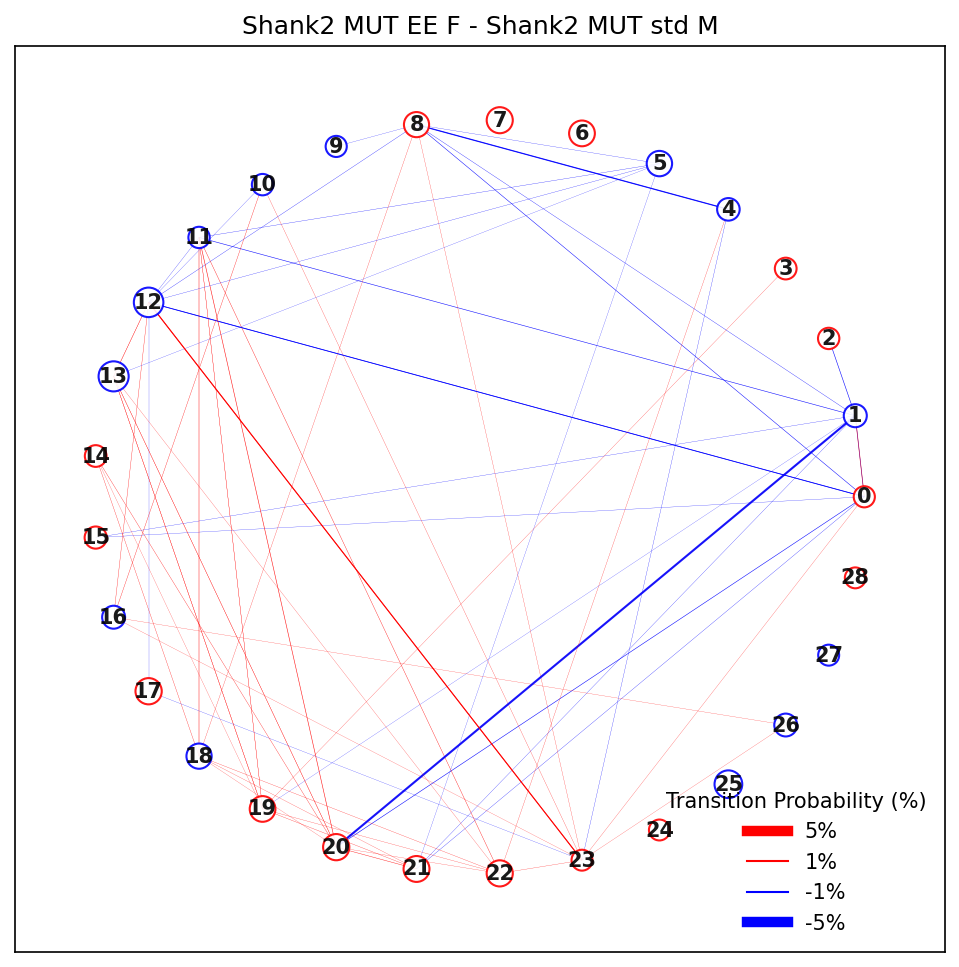

...

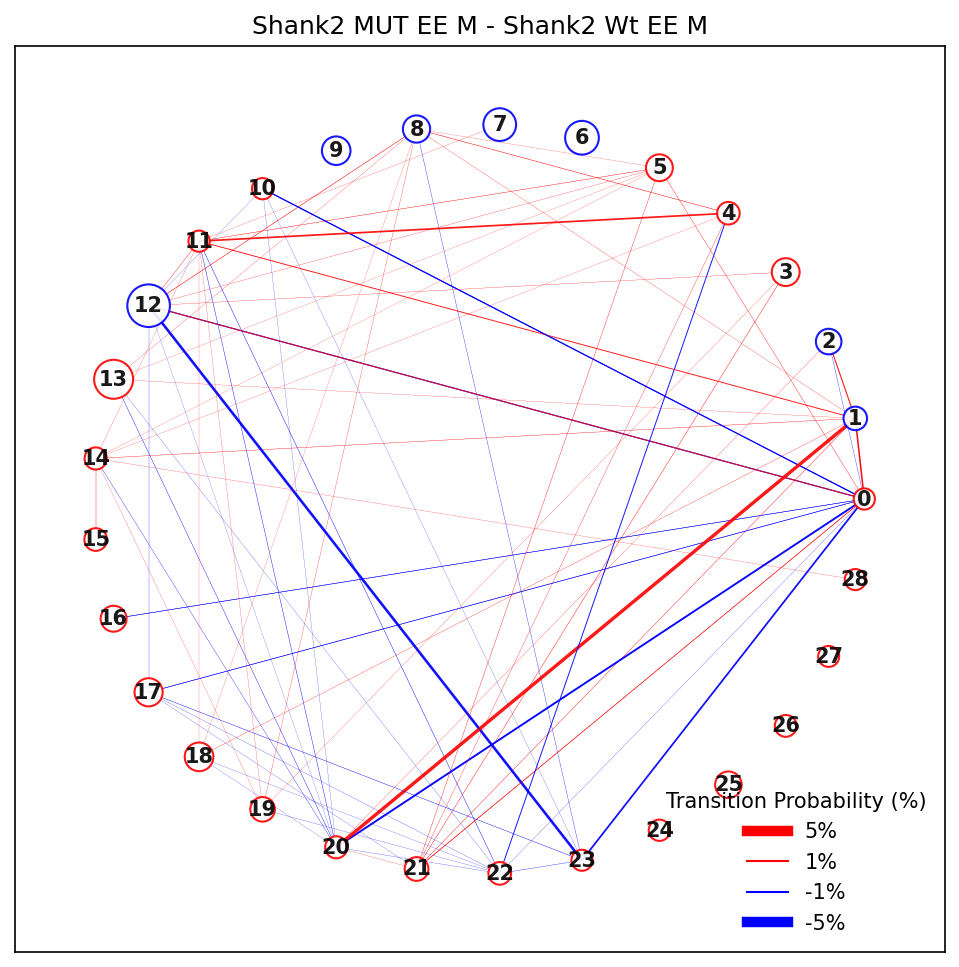

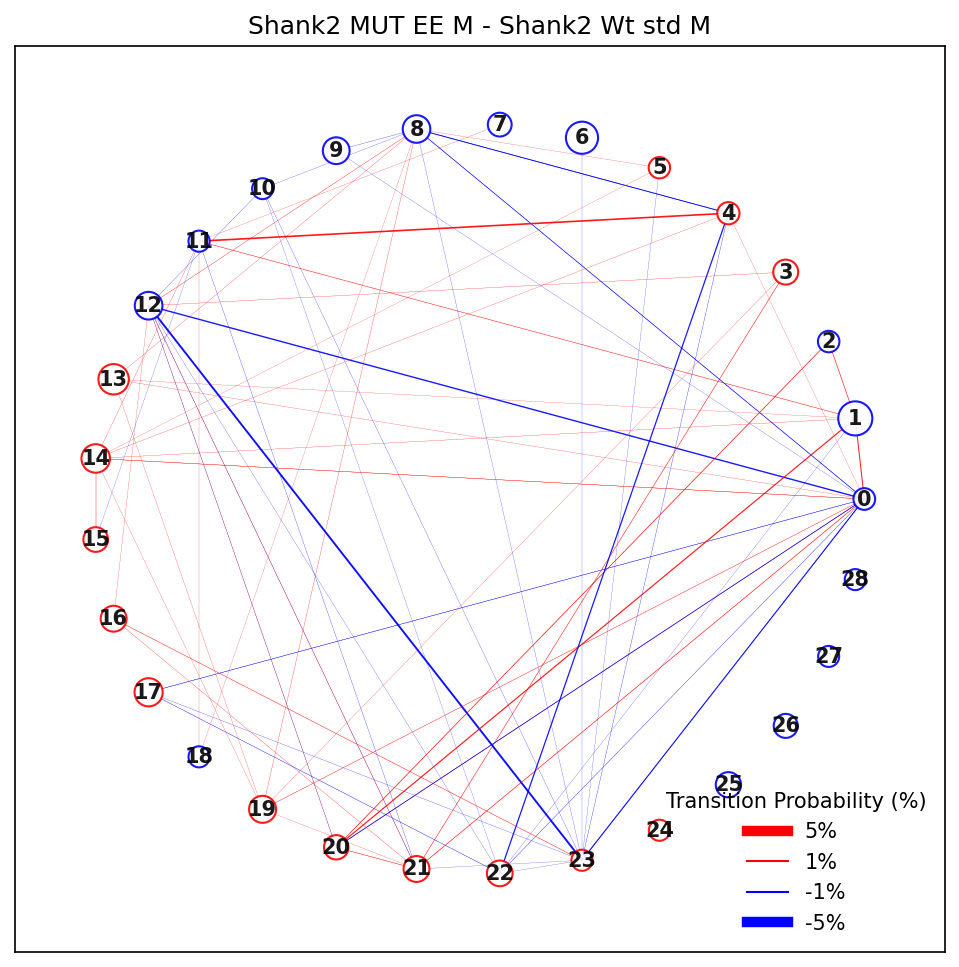

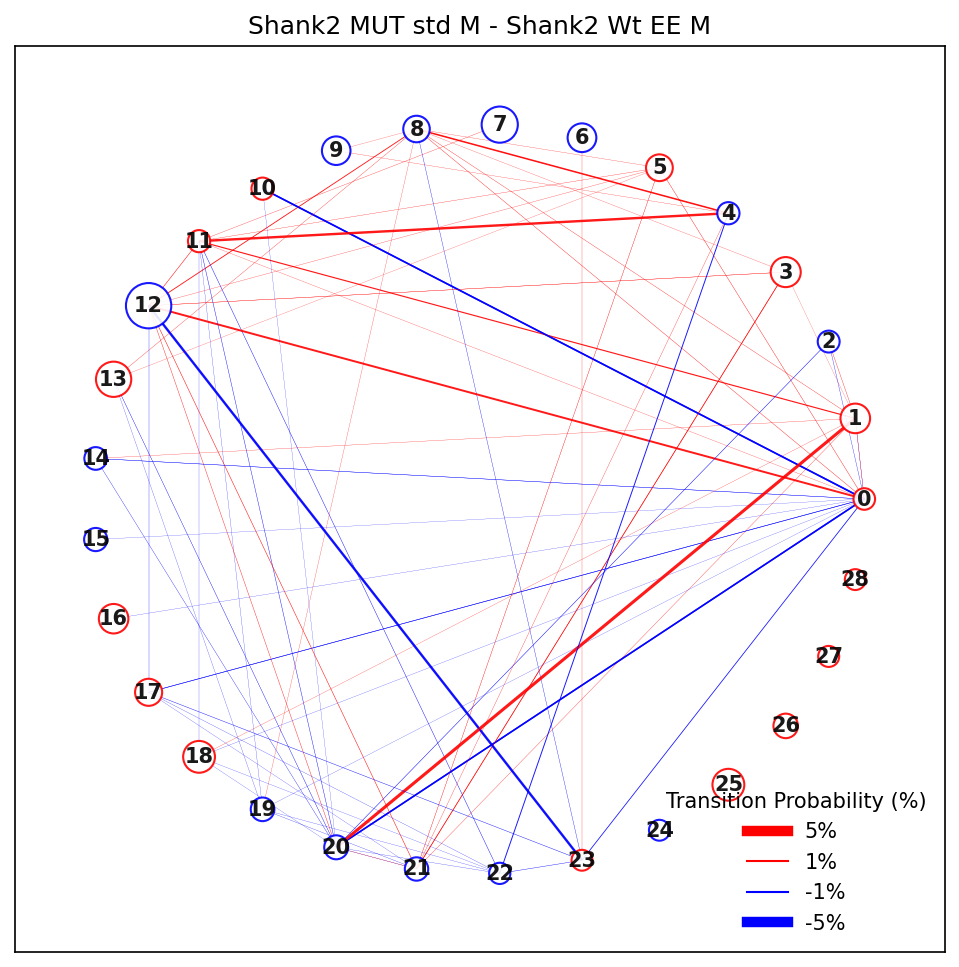

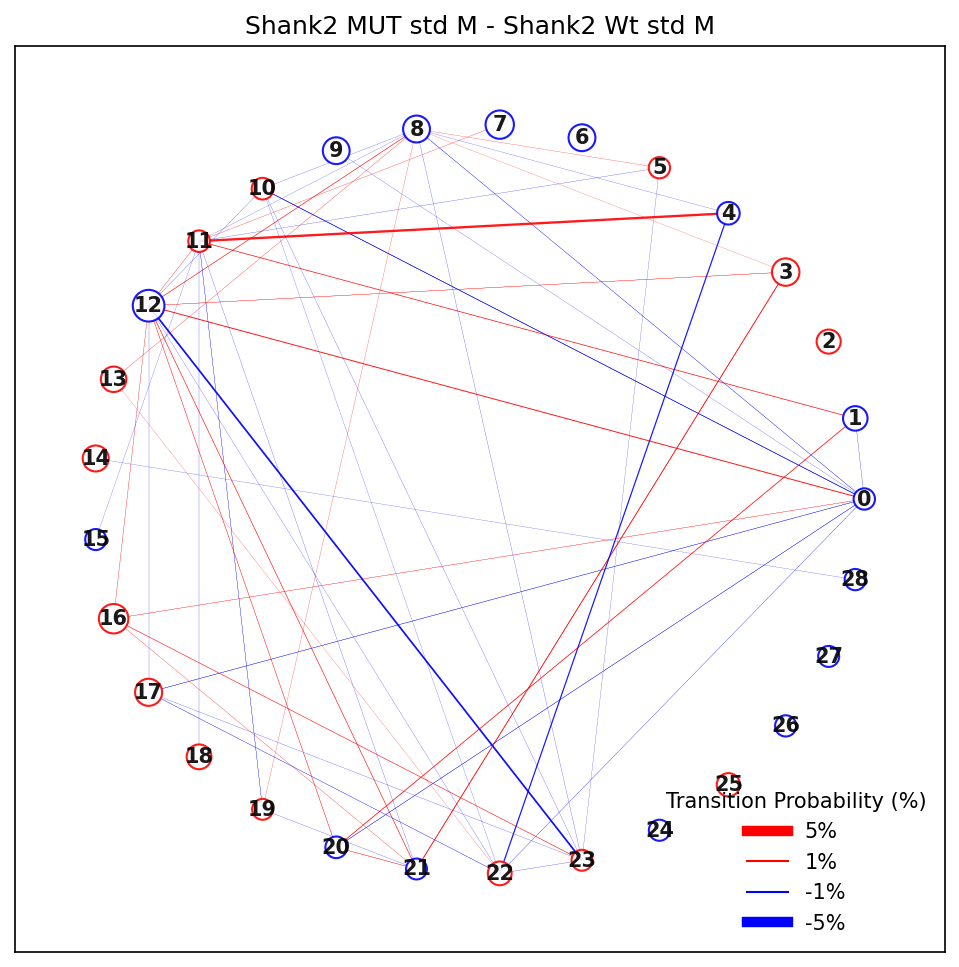

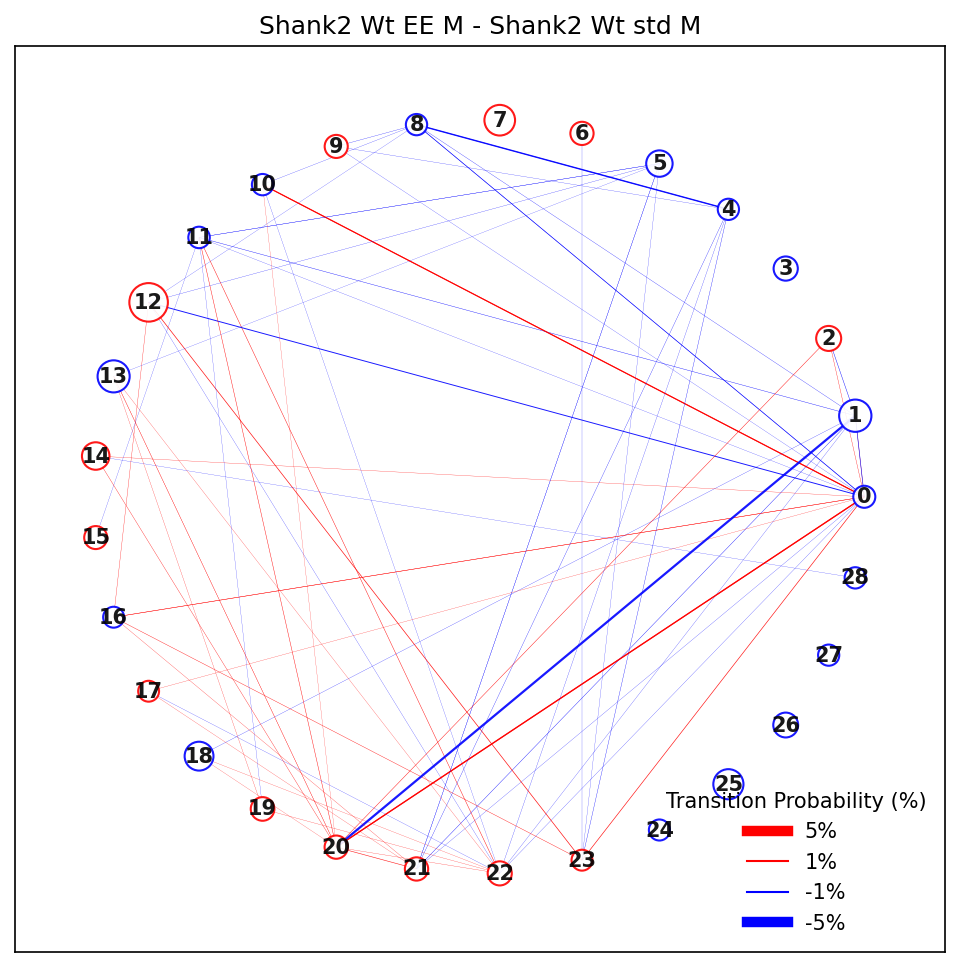

In [60]:
#plot the relative graphs, and save their svg 
for i in range(len(labelsdiff)):
    
    G=graphs[len(files)+i][0]
    pos=nx.circular_layout(G)
    plt.figure(figsize=(8, 8),dpi=150)
    edge_weight = list(nx.get_edge_attributes(G,'weight').values())
    nodesize=abs(usagediff[i])*node_scaling+uni_node_scaling*10
    colorarray=np.array(edge_weight)
    blue=colorarray <0
    red=colorarray>0
    colorarray=colorarray.astype(str)
    colorarray[blue]= "b"
    colorarray[red]= "r"
    nodecolor=usagediff[i].astype(str)
    blue=usagediff[i]<0
    red=usagediff[i]>=0
    nodecolor[blue]="b"
    nodecolor[red]="r"
    plt.title(labelsdiff[i])
    options = { "alpha": 0.9}
    nx.draw_networkx(G, with_labels=True, font_weight='bold',
                     pos=pos,width=edge_weight,node_size=list(nodesize[:40]),arrows=False,
                     node_color='w',edgecolors=nodecolor[:40],font_size=10, font_color="k",edge_color=colorarray, **options)
    filename=str(labelsdiff[i])+"_network.svg"
    plt.legend(legend_lines_rel, legend_labels_rel, title='Transition Probability (%)', frameon=False, loc='lower right')
    plt.savefig(join(save_path, filename), format = 'svg', dpi=300)

In [171]:
graphs

[[<networkx.classes.multidigraph.MultiDiGraph at 0x7f2a1fe22130>],